### **ADVANCED ARTIFICIAL INTELLIGENCE**

## MINI PROJECT - **Style Transfer**

In [ ]:
#Import libraries
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import requests
from io import BytesIO
import matplotlib.pyplot as plt


import torchvision.transforms as transforms
import torchvision.models as models

import copy

In [ ]:
#If this machine have a gpu (cuda is available) we use it. Otherwise our fallback is the CPU.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
#Hyperparameters
ITERATIONS = 20 # Number of iterations
IMAGE_WIDTH = 512 # 512x512 is fine for HD images
IMAGE_HEIGHT = 512
CONTENT_WEIGHT = 1 # Weight of the content loss
STYLE_WEIGHT = 0.01 # Weight og the style loss
TOTAL_VARIATION_WEIGHT = 15 # Weight of the total variation loss
INPUT_IMAGE = 'noise' # Can be : 'noise', 'content', 'style', or a path to a file.

In [ ]:
content_layers = ['conv_1', 'conv_2', 'conv_4']
style_layers = ['conv_2', 'conv_3', 'conv_4', 'conv_7', 'conv_10', 'conv_8']

In [ ]:
#Names under which the images will be saved
content_image_path = "content.png"
style_image_path = "style.png"
output_image_path = "result.png"
combined_image_path = "combined.png"

IMAGE SELECTION

In [ ]:
# Content images
san_francisco = "https://www.economist.com/sites/default/files/images/print-edition/20180602_USP001_0.jpg"
cat = "https://t1.uc.ltmcdn.com/fr/images/4/5/5/img_comment_soigner_un_chat_de_la_maladie_de_carre_9554_orig.jpg"
dog = "https://raw.githubusercontent.com/gaganbahga/cosine_art/master/test_images/test_image_2.jpg"
doge = "https://raw.githubusercontent.com/codazzo/dogr/master/public/doge.png"

# Style images:
tytus = "http://meetingbenches.com/wp-content/flagallery/tytus-brzozowski-polish-architect-and-watercolorist-a-fairy-tale-in-warsaw/tytus_brzozowski_13.jpg"
elephant = "https://images.yaoota.com/FNOKU0Srh8eNe-i-VRAfb4tm7S8=/trim/yaootaweb-production-ng/media/crawledproductimages/4d226297bb4d97b03abcb2c76073a90888068ac0.jpg"
colorswir = "https://paintings.pinotspalette.com/colorful-swirly-sky-tv.jpg?v=10026315"
scream = "https://painting-planet.com/images/1/image046.jpg"

# The function wich allow us to download / open an image
def open_image(url):
  if url.startswith("http"):
    return Image.open(BytesIO(requests.get(url).content))
  else:
    return Image.open(url)

This is where you select your __Content image__ and __Style Image__.

In [ ]:
content_url = san_francisco
style_url = colorswir

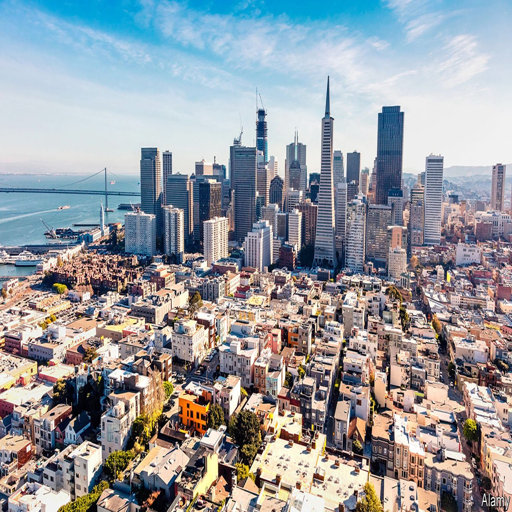

In [ ]:
content_image = open_image(content_url)
content_image = content_image.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
content_image.save(content_image_path)
content_image

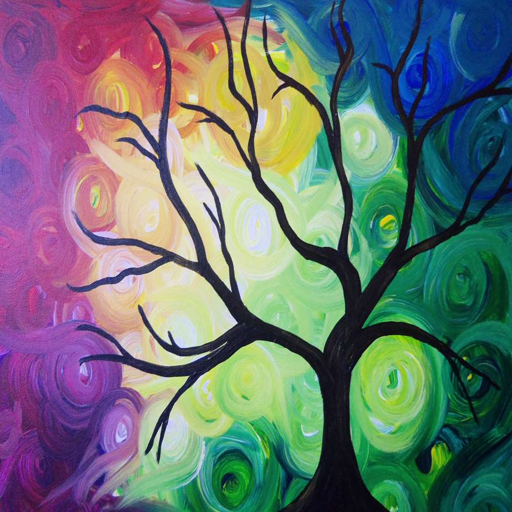

In [ ]:
style_image = open_image(style_url)
style_image = style_image.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
style_image.save(style_image_path)
style_image

In [ ]:
#Feature Loss
class ContentLoss(nn.Module):
  def __init__(self, target,):
    super(ContentLoss, self).__init__()
    # We 'detach' the target content from the tree used
    # to dynamically compute the gradient: this is a stated value,
    # not a variable.
    self.target = target.detach()

  def forward(self, input):
    self.loss = F.mse_loss(input, self.target)
    return input

In [ ]:
#StyleLoss
class StyleLoss(nn.Module):
  def __init__(self, target_feature):
    super(StyleLoss, self).__init__()
    self.target = self.gram_matrix(target_feature).detach()

  def forward(self, input):
    G = self.gram_matrix(input)
    self.loss = F.mse_loss(G, self.target)
    return input

  @staticmethod
  def gram_matrix(input):
    a, b, c, d = input.size()
    # Here:
    # a is the batch size(=1)
    # b is the number of feature maps
    # (c,d) are the dimensions of a feature map

    # We reshape the activation layer into a collection of feature vectors
    features = input.view(a * b, c * d)

    # Compute the gram product
    G = torch.mm(features, features.t())

    # We 'normalize' the values of the gram matrix
    # by dividing by the norm of gram matrix filled with ones.
    return G.div((a * b * c * d) ** 0.5)

In [ ]:
#Total Variation
def total_variation_loss(x): # Expect a mini batch of dim NxWxH
  image_height = x.shape[1]
  image_width = x.shape[2]
  dx = x[:, :image_height-1, :image_width-1, :] - x[:, 1:, :image_width-1, :]
  dy = x[:, :image_height-1, :image_width-1, :] - x[:, :image_height-1, 1:, :]
  loss = (dx ** 2 + dy ** 2).sum() ** 0.5
  # Return loss normalized by image and batch size
  return loss / (image_width * image_height * x.shape[0])

In [ ]:
# Normalization
# Create a module to normalize input image so we can easily put it in a
# nn.Sequential
class Normalization(nn.Module):
  def __init__(self, mean, std):
    super(Normalization, self).__init__()
    # Reshape the mean and std to make them [C x 1 x 1] so that they can
    # directly broadcast to image Tensor of shape [B x C x H x W].
    # B is batch size. C is number of channels. H is height and W is width.
    self.mean = torch.tensor(mean).view(-1, 1, 1)
    self.std = torch.tensor(std).view(-1, 1, 1)

  def forward(self, img):
    # Normalize img
    return (img - self.mean) / self.std


In [ ]:
# We now load our pretrained neural network (VGG19) for computing the losses.
# Neural network used.
cnn = models.vgg19(pretrained=True).features.to(device).eval()

# Normalization mean and standard deviation.
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:05<00:00, 98.5MB/s]


In [ ]:
def get_model_and_losses(style_img, content_img,
                               cnn=cnn,
                               cnn_normalization_mean=cnn_normalization_mean,
                               cnn_normalization_std=cnn_normalization_std):
  # We make a deep copy of vgg19 in order to not modify the original
  cnn = copy.deepcopy(cnn)

  # Normalization module
  normalization = Normalization(cnn_normalization_mean, cnn_normalization_std).to(device)

  # This list will contain the losses computed by the network.
  content_losses = []
  style_losses = []

  # We rebuild the model as a nn sequential whose first layer is
  # our normalization layer.
  model = nn.Sequential(normalization)

  # We brows the layer of `cnn` and stack them into `model`.
  i = 0  # Incremented every time we see a conv layer.
  for layer in cnn.children():

    if isinstance(layer, nn.Conv2d):
        i += 1
        name = 'conv_{}'.format(i)
    elif isinstance(layer, nn.ReLU):
        name = 'relu_{}'.format(i)
        # The in-place version doesn't play very nicely with the ContentLoss
        # and StyleLoss we insert below. So we replace with out-of-place
        # ones here.
        layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
        name = 'pool_{}'.format(i)
    elif isinstance(layer, nn.BatchNorm2d):
        name = 'bn_{}'.format(i)
    else:
        raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

    model.add_module(name, layer)

    # Check if the layer we just added was in the content layer list.
    # If so, we just stack a Content Loss layer.
    if name in content_layers:
      target = model(content_img).detach()
      content_loss = ContentLoss(target)
      model.add_module("content_loss_{}".format(i), content_loss)
      content_losses.append(content_loss)

    # Check if the layer we just added was in the style layer list.
    # If so, we just stack a Style Loss layer.
    if name in style_layers:
      target_feature = model(style_img).detach()
      style_loss = StyleLoss(target_feature)
      model.add_module("style_loss_{}".format(i), style_loss)
      style_losses.append(style_loss)

  # Now we trim off the layers after the last content and style losses
  # to keep the model as small as possible.
  for i in range(len(model) - 1, -1, -1):
      if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
          break

  model = model[:(i + 1)]

  return model, style_losses, content_losses

We write a function converting PIL images to a `torch.Tensor` and apply it to our input images.

In [ ]:
def image_to_tensor(image):
  # Transform to tensor
  image = transforms.ToTensor()(image)
  # Fake batch dimension required to fit network's input dimensions
  image = image.unsqueeze(0)
  # Move to the right device and convert to float
  return image.to(device, torch.float)

content_img = image_to_tensor(content_image)
style_img = image_to_tensor(style_image)

We now declare the inverse function, converting back tensor to images.

In [ ]:
# Reconvert a tensor into PIL image
def tensor_to_image(tensor):
  img = (255 * tensor).cpu().detach().squeeze(0).numpy()
  img = img.clip(0, 255).transpose(1, 2, 0).astype("uint8")
  return Image.fromarray(img)

We now generate or load the input image from which we are going to converge.

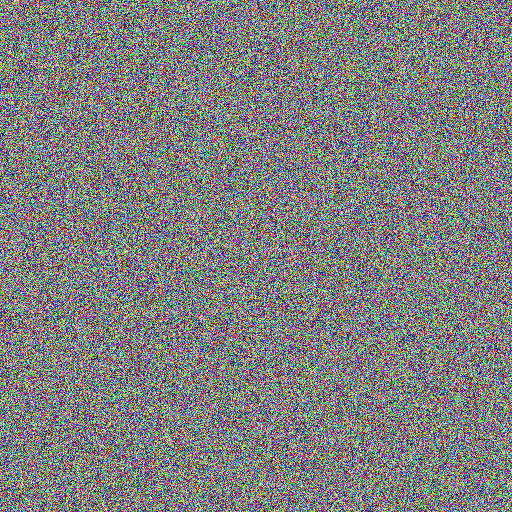

In [ ]:
#@title This is the _input_ image
if INPUT_IMAGE == 'noise':
  input_img = torch.randn(content_img.data.size(), device=device)
elif INPUT_IMAGE == 'content':
  input_img = content_img.clone()
elif INPUT_IMAGE == 'style':
  input_img = style_img.clone()
else:
  image = open_image(INPUT_IMAGE).resize((IMAGE_SIZE, IMAGE_SIZE))
  input_img = image_to_tensor(image)
  input_img += torch.randn(content_img.data.size(), device=device)*0.1

# To visualise it better, instead of clipping values, we rescale
# them to fit [-1,1], and convert to an image. This is mostly because
# the visualization given is closer to what the actual values stored
# in the tensor are.
if INPUT_IMAGE == 'noise':
  img = transforms.ToPILImage()(input_img[0].cpu())
else:
  img = tensor_to_image(input_img[0])
img

We have to choose an optimisation algorithm for our gradient descent.
The algorithm giving the best visual result is LBFGS. But you can try other algorithms like Adam, RAdam, SGD...

In [ ]:
def get_input_optimizer(input_img):
  # This line tell LBFGS what parameters we should optimize
  optimizer = optim.LBFGS([input_img.requires_grad_()])
  #optimizer = optim.Adam([input_img.requires_grad_()])
  return optimizer

We add one more function in order to display the evolution of the input image while the algorithm run.

In [ ]:
def show_evolution(tensor, history=[], title=None):
    image = tensor.cpu().clone().squeeze(0)
    image = tensor_to_image(image)
    # Display a big figure
    plt.rcParams['figure.figsize'] = [10, 5]
    plt.figure()
    # Image
    plt.subplot(121)
    plt.imshow(image)
    plt.axis('off')
    if title is not None:
        plt.title(title)
    # Losses
    ax = plt.subplot(122)
    plt.yscale('log')
    plt.title('Losses')
    import numpy as np
    history = np.array(history).T
    plt.plot(history[0], label='Style')
    plt.plot(history[1], label='Content')
    plt.plot(history[2], label='Variation')
    plt.plot(history[3], label='Sum')
    plt.legend(loc="upper right")
    # Finaly show the graph
    plt.show()
    # Display a textual message
    print('Style Loss : {:4f} Content Loss: {:4f} Variation Loss: {:4f} Sum: {:4f}'.format(
        history[0][-1], history[1][-1], history[2][-1], history[3][-1]))

We are now ready to converge toward our AI painted image.

Building the style transfer model..


<ipython-input-13-c52423c020b9>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
<ipython-input-13-c52423c020b9>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


Optimizing..


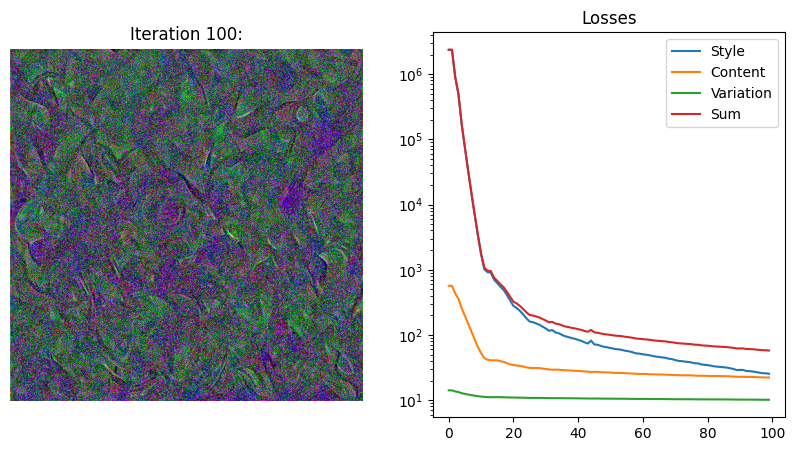

Style Loss : 25.373243 Content Loss: 22.221287 Variation Loss: 10.129565 Sum: 57.724094


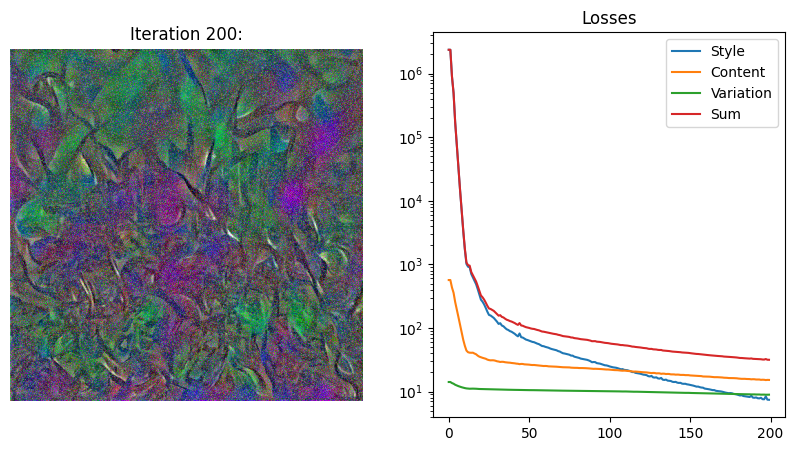

Style Loss : 7.427429 Content Loss: 15.230370 Variation Loss: 8.934581 Sum: 31.592381


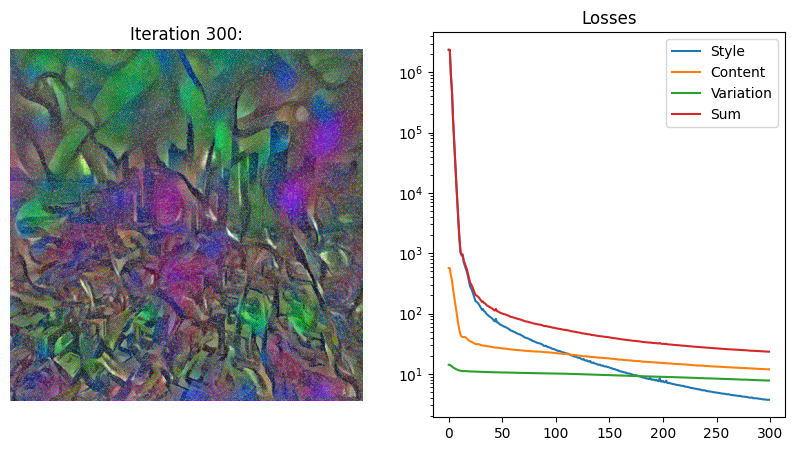

Style Loss : 3.711859 Content Loss: 11.873079 Variation Loss: 7.732803 Sum: 23.317741


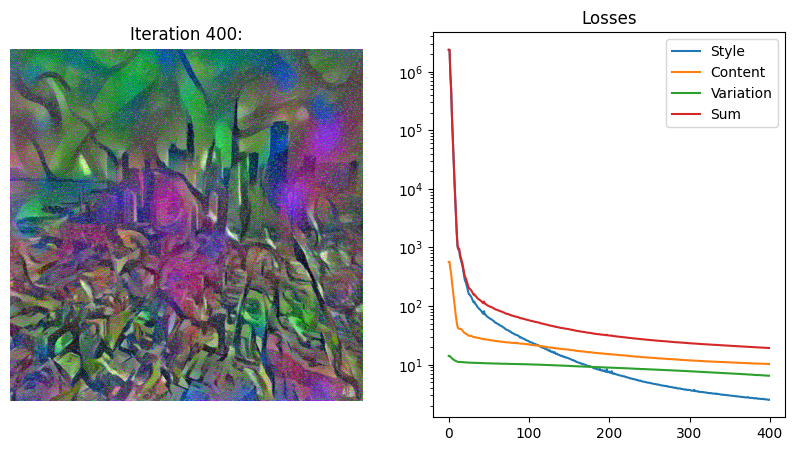

Style Loss : 2.515702 Content Loss: 10.275956 Variation Loss: 6.469996 Sum: 19.261654


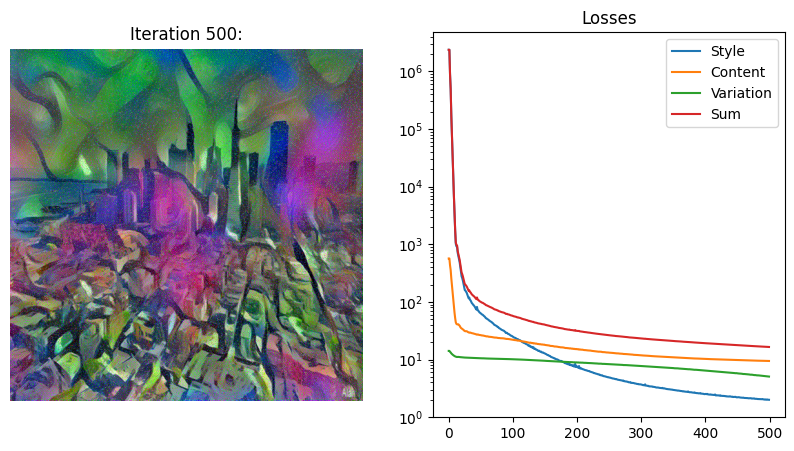

Style Loss : 2.005818 Content Loss: 9.451485 Variation Loss: 5.068702 Sum: 16.526005


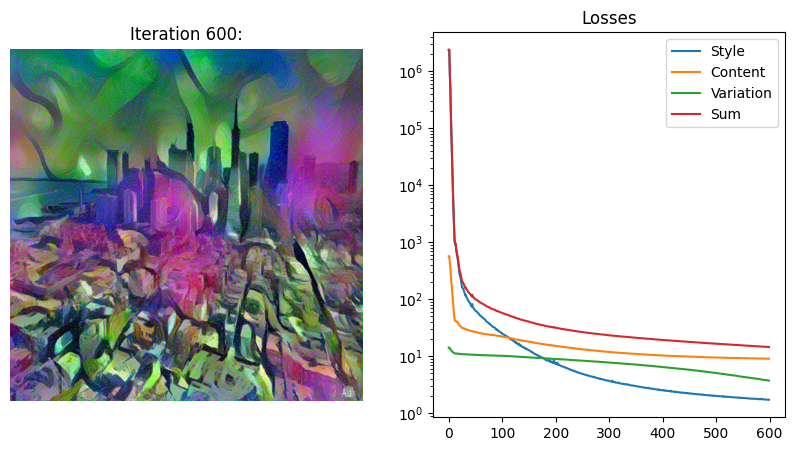

Style Loss : 1.715214 Content Loss: 9.014914 Variation Loss: 3.717108 Sum: 14.447235


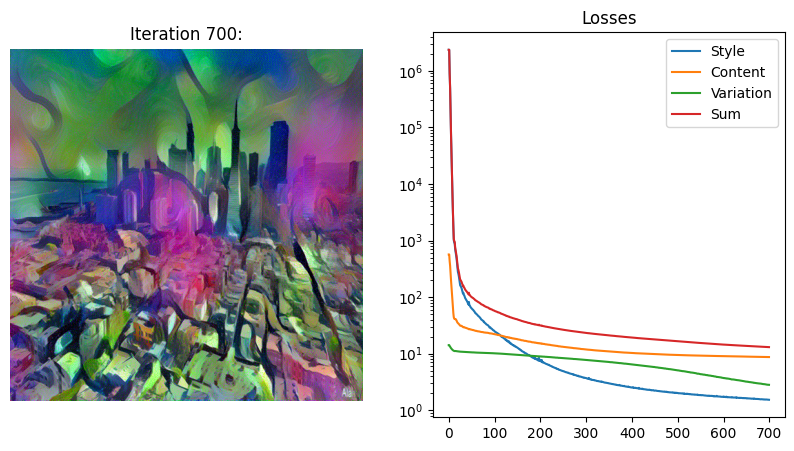

Style Loss : 1.525679 Content Loss: 8.687689 Variation Loss: 2.806217 Sum: 13.019585


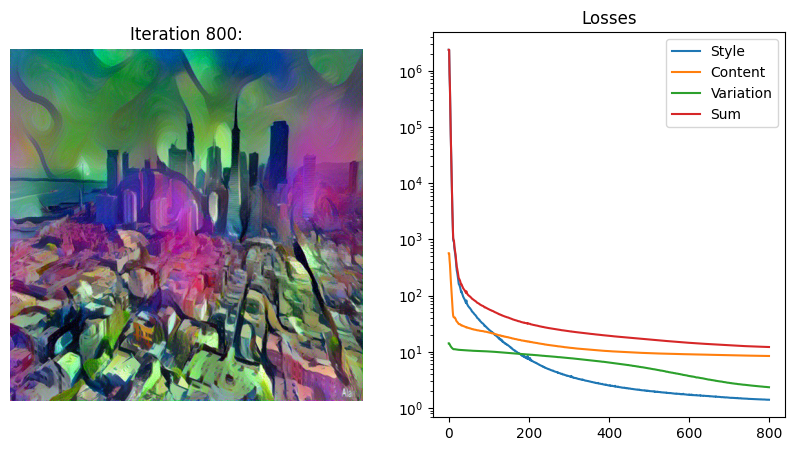

Style Loss : 1.400691 Content Loss: 8.411231 Variation Loss: 2.338752 Sum: 12.150674


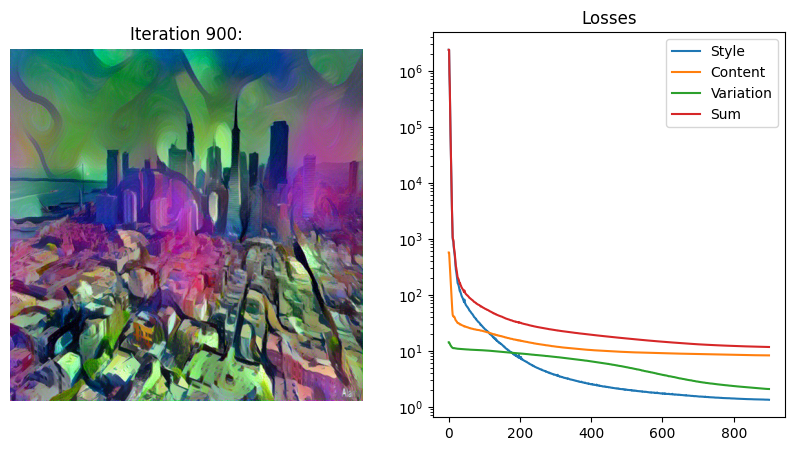

Style Loss : 1.327634 Content Loss: 8.236423 Variation Loss: 2.067329 Sum: 11.631387


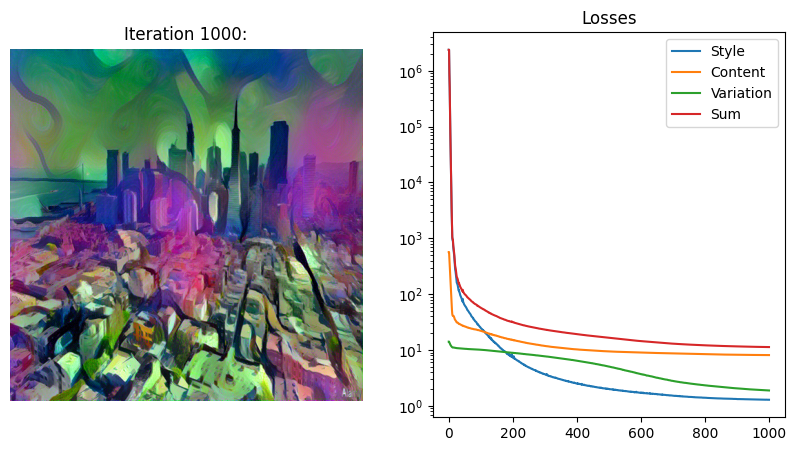

Style Loss : 1.289142 Content Loss: 8.123416 Variation Loss: 1.890549 Sum: 11.303107


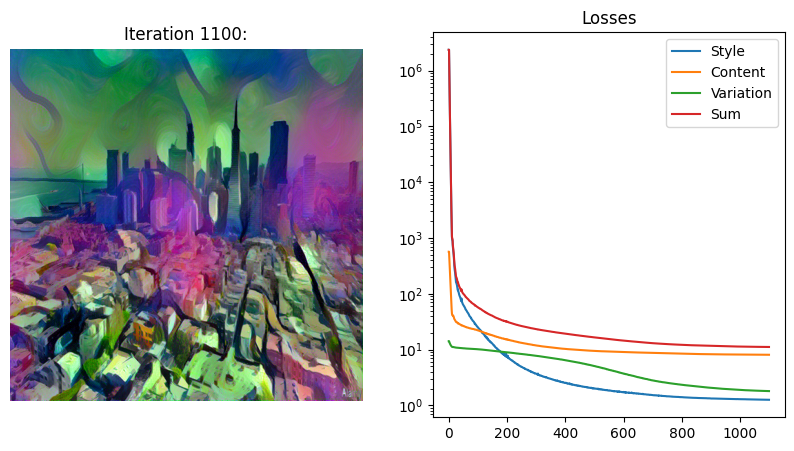

Style Loss : 1.257072 Content Loss: 8.057517 Variation Loss: 1.798874 Sum: 11.113464


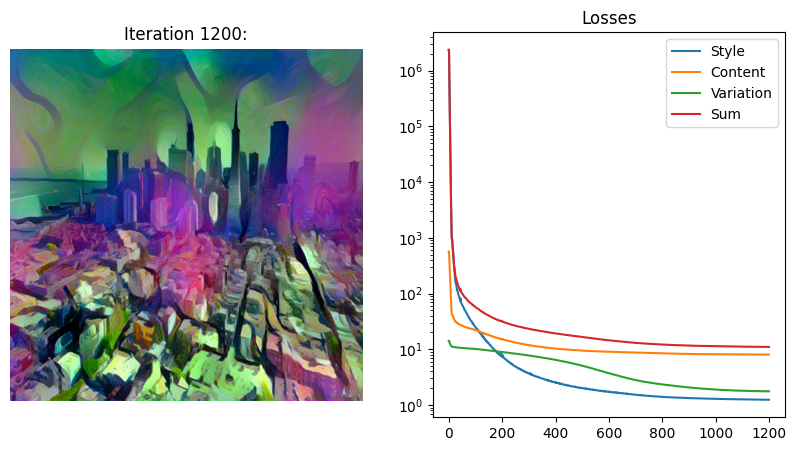

Style Loss : 1.238950 Content Loss: 8.016532 Variation Loss: 1.755473 Sum: 11.010955


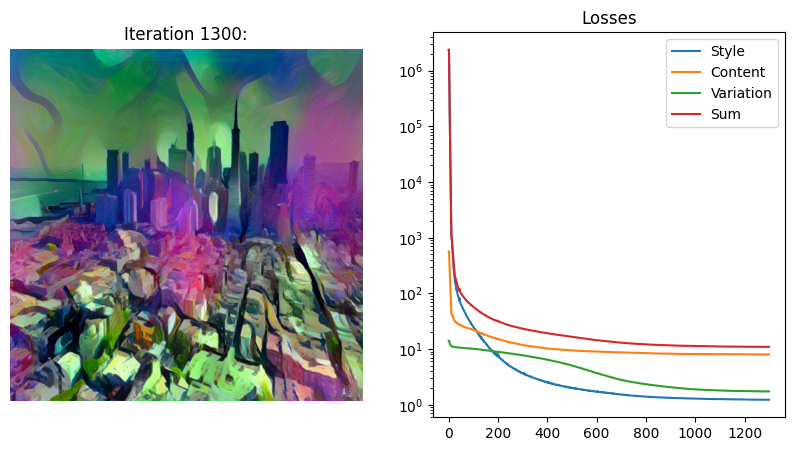

Style Loss : 1.227947 Content Loss: 7.989185 Variation Loss: 1.733945 Sum: 10.951077


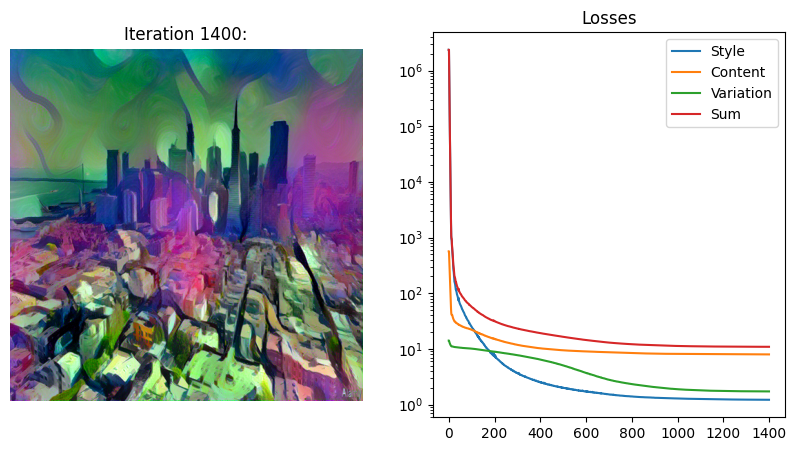

Style Loss : 1.220619 Content Loss: 7.973196 Variation Loss: 1.724999 Sum: 10.918814


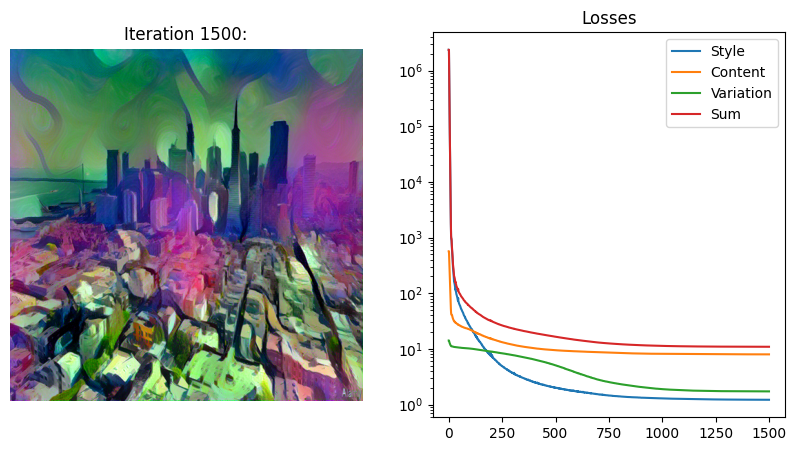

Style Loss : 1.216288 Content Loss: 7.962040 Variation Loss: 1.721032 Sum: 10.899360


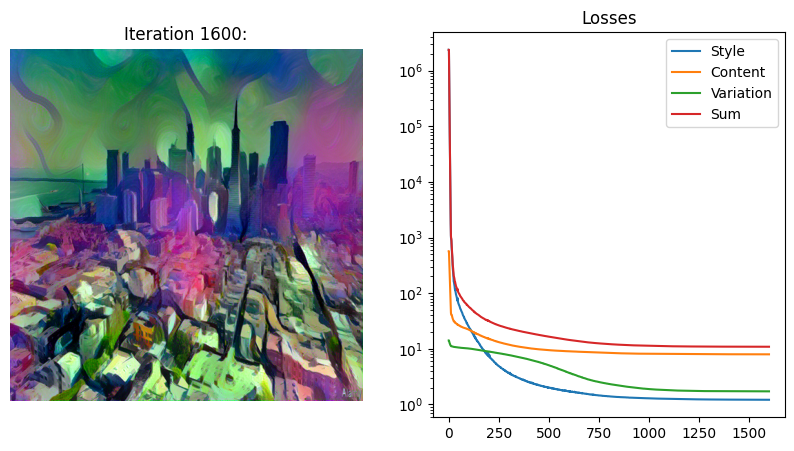

Style Loss : 1.212738 Content Loss: 7.953950 Variation Loss: 1.719020 Sum: 10.885708


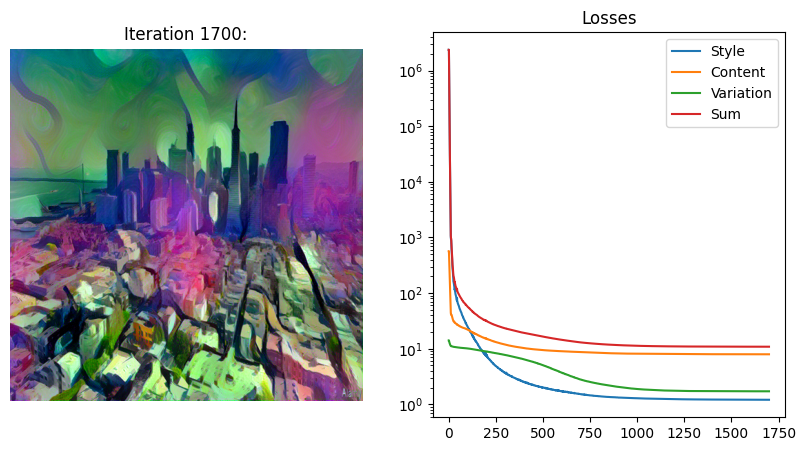

Style Loss : 1.209487 Content Loss: 7.947830 Variation Loss: 1.717944 Sum: 10.875261


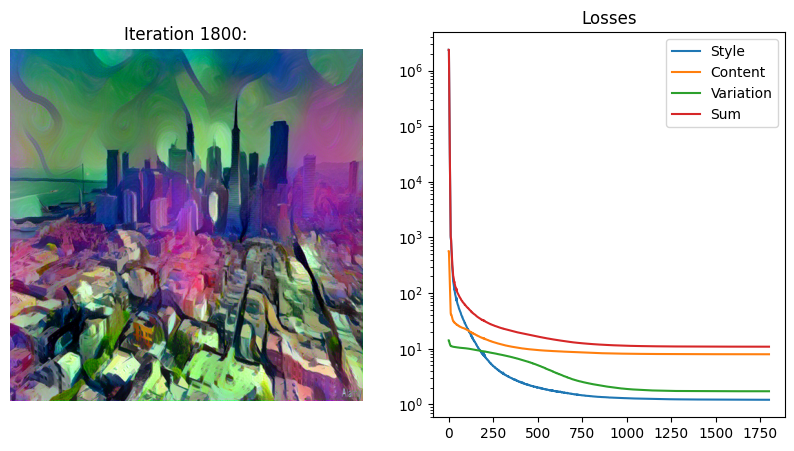

Style Loss : 1.207126 Content Loss: 7.942435 Variation Loss: 1.717390 Sum: 10.866951


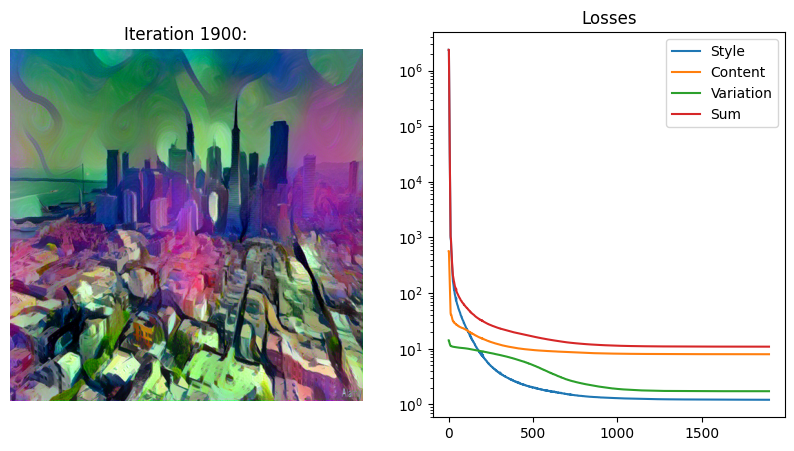

Style Loss : 1.204611 Content Loss: 7.938327 Variation Loss: 1.717094 Sum: 10.860032


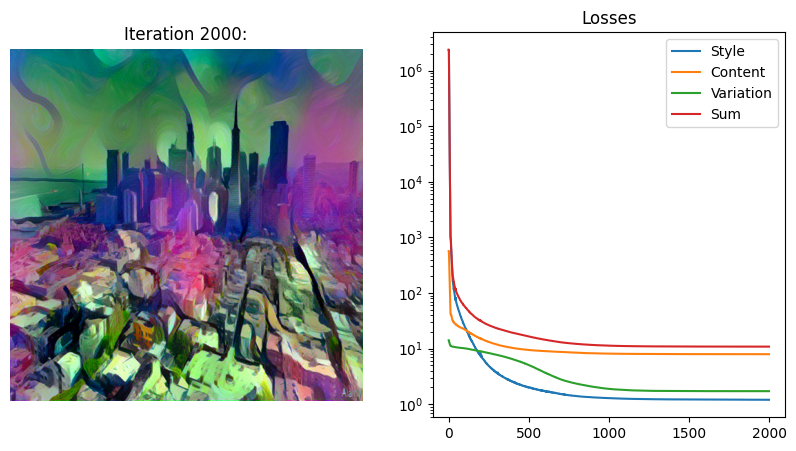

Style Loss : 1.202001 Content Loss: 7.934858 Variation Loss: 1.716987 Sum: 10.853846


In [ ]:
print('Building the style transfer model..')
model, style_losses, content_losses = get_model_and_losses(style_img, content_img)
optimizer = get_input_optimizer(input_img)

print('Optimizing..')
iterations = 0
history=[]
while iterations <= ITERATIONS * 100:
  # Compute the loss and backpropagate to the input_image.
  # (The LBFGS optimizer only accept work through closures.)
  def closure():
      global history
      global iterations

      optimizer.zero_grad()

      # Compute the total variation loss
      variation_score = total_variation_loss(input_img) * TOTAL_VARIATION_WEIGHT
      # Compute the features through the model
      model(input_img)
      # Compute style and content losses
      style_score = sum(sl.loss for sl in style_losses)
      style_score *= STYLE_WEIGHT / len(style_losses)
      content_score = sum(cl.loss for cl in content_losses)
      content_score *= CONTENT_WEIGHT / len(content_losses)
      # Our global loss is the sum of the 3 values
      loss = style_score + content_score + variation_score
      # Save the value of loss in order to draw them as a graph
      history += [[style_score.item(), content_score.item(), variation_score.item(), loss.item()]]

      # If the iteration is a multiple of 100, display some informations
      iterations += 1
      if iterations % 100 == 0:
          show_evolution(input_img.data.clone().detach().clamp(0, 1), history, title="Iteration %d:" % iterations)

      # Backpropagate gradients and leave the optimizer do his job.
      loss.backward()
      return loss

  optimizer.step(closure)


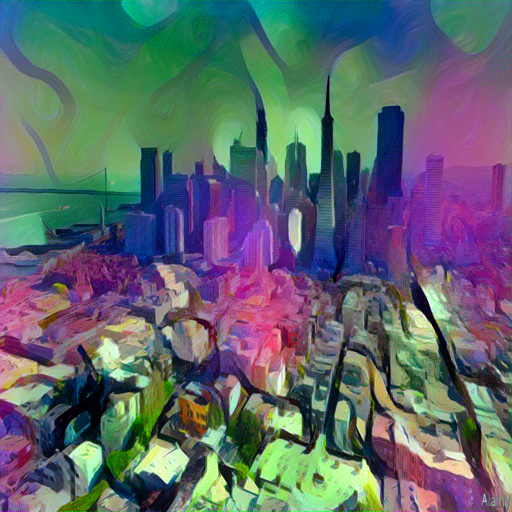

In [ ]:
#@title Our result
img = tensor_to_image(input_img)
img.save(output_image_path)
img

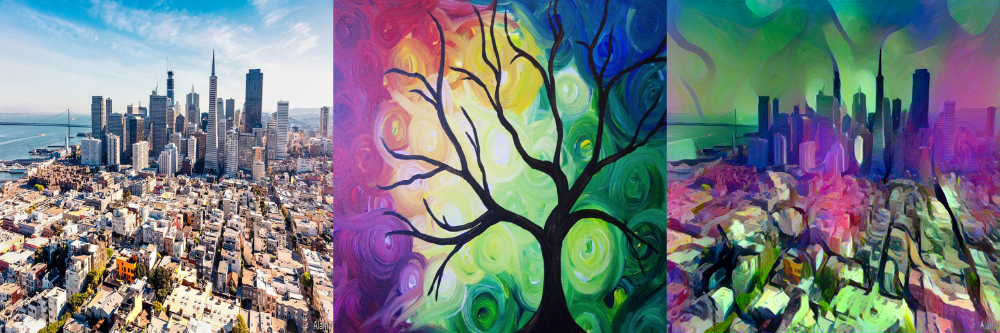

In [ ]:
#@title Our combined results
combined = Image.new("RGB", (IMAGE_WIDTH*3, IMAGE_HEIGHT))
x_offset = 0
for image in map(Image.open, [content_image_path, style_image_path, output_image_path]):
    combined.paste(image, (x_offset, 0))
    x_offset += IMAGE_WIDTH
combined.save(combined_image_path)
combined